In [32]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
import cv2
import skimage
from numba import jit
from modules.process import Process
from modules.edge import get_bright_edge
from modules.mass_center import compute_mass_center
from modules.bright2dark import get_b2d_data
from modules.dense_area import get_dense_area
from modules.grouping import divideIntoGroups
from modules.helper import display_images, display_stats
from modules.fft import lowpass_filter
from modules.fitting import fit2circle, fit2circle_points
from modules.mask import to_mask, get_dilated_mask
from modules.contour import get_largest_brightness_diff_contour_id, select_concentric_contour_indices
from config import base_dir

In [33]:
def run(instance):
    dilated_dust_mask = get_dilated_mask(instance.dust_mask)
    ellipses = []
    circles = []
    for i in range(60):
        gray = instance.gray_images[i].copy()
        # mass center
        cx, cy = compute_mass_center(gray, dilated_dust_mask)

        # edge points
        edge = get_bright_edge(gray)
        edge[dilated_dust_mask == 1] = 0

        # b2d data
        blurred = cv2.GaussianBlur(gray, ksize=(7, 7), sigmaX=0, sigmaY=0)
        b2d_vector_image, cos_image = get_b2d_data(blurred, cx, cy, sobel_ksize=3)

        # b2d mask
        b2d_mask = np.ones(gray.shape)
        b2d_mask[cos_image < 0.3] = 0
        b2d_mask[b2d_vector_image < np.mean(b2d_vector_image)] = 0
        group_sizes, grouped = divideIntoGroups(b2d_mask, ksize=3)
        small_group_mask = np.zeros(b2d_mask.shape)
        for group_id, group_size in enumerate(group_sizes):
            if group_size < 50:
                small_group_mask[grouped == group_id] = 1
        new_b2d_mask = np.copy(b2d_mask)
        new_b2d_mask[small_group_mask == 1] = 0

        # 境界点群の絞り込み
        new_edge = np.copy(edge)
        new_edge[new_b2d_mask == 0] = 0
        new_edge_binary = np.copy(new_edge)
        new_edge_binary[new_edge_binary > 0] = 1
        new_edge_binary = cv2.dilate(new_edge_binary, kernel=(5, 5))

        # 輪郭群の検出と絞り込み
        contours, _ = cv2.findContours(new_edge_binary.astype('uint8'), cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)
        standard_contour_id = get_largest_brightness_diff_contour_id(contours, new_edge_binary, b2d_vector_image, instance.dust_mask)
        concentric_contour_indices = select_concentric_contour_indices(contours, standard_contour_id, circle_thickness=10)
        concentric_contours = [c for i, c in enumerate(contours) if i in concentric_contour_indices]
        ellipse = cv2.fitEllipseAMS(np.concatenate(concentric_contours))
        circle = fit2circle(concentric_contours)
        ellipses.append(ellipse)
        circles.append(circle)
    
    return ellipses, circles

def test_run(instance, index):
    gray = instance.gray_images[index]

    # mass center
    dilated_dust_mask = get_dilated_mask(instance.dust_mask)
    cx, cy = compute_mass_center(gray, dilated_dust_mask)

    # edge points
    edge = get_bright_edge(gray)
    edge[dilated_dust_mask == 1] = 0

    # b2d data
    blurred = cv2.GaussianBlur(gray, ksize=(7, 7), sigmaX=0, sigmaY=0)
    b2d_vector_image, cos_image = get_b2d_data(blurred, cx, cy, sobel_ksize=3)

    # b2d mask
    b2d_mask = np.ones(gray.shape)
    b2d_mask[cos_image < 0.3] = 0
    b2d_mask[b2d_vector_image < np.mean(b2d_vector_image)] = 0
    group_sizes, grouped = divideIntoGroups(b2d_mask, ksize=3)
    small_group_mask = np.zeros(b2d_mask.shape)
    for group_id, group_size in enumerate(group_sizes):
        if group_size < 50:
            small_group_mask[grouped == group_id] = 1
    new_b2d_mask = np.copy(b2d_mask)
    new_b2d_mask[small_group_mask == 1] = 0

    # 境界点群の絞り込み
    new_edge = np.copy(edge)
    new_edge[new_b2d_mask == 0] = 0
    new_edge_binary = np.copy(new_edge)
    new_edge_binary[new_edge_binary > 0] = 1
    new_edge_binary = cv2.dilate(new_edge_binary, kernel=(5, 5))

    # 輪郭群の検出と絞り込み
    contours, _ = cv2.findContours(new_edge_binary.astype('uint8'), cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)
    standard_contour_id = get_largest_brightness_diff_contour_id(contours, new_edge_binary, b2d_vector_image, instance.dust_mask)
    concentric_contour_indices = select_concentric_contour_indices(contours, standard_contour_id, circle_thickness=10)
    concentric_contours = [c for i, c in enumerate(contours) if i in concentric_contour_indices]
    ellipse = cv2.fitEllipseAMS(np.concatenate(concentric_contours))
    circle = fit2circle(concentric_contours)
    print(f'Fitting result:\n ellipse{ellipse}\n circle {circle}')

    canvas_standard_contour = gray.copy()
    cv2.drawContours(canvas_standard_contour, [contours[standard_contour_id]], 0, 0, 3)
    canvas_concentric_contours = gray.copy()
    for i, contour in enumerate(concentric_contours):
        cv2.drawContours(canvas_concentric_contours, [contour], 0, 0, 1)
    canvas_all_contours = gray.copy()
    for i, contour in enumerate(contours):
        cv2.drawContours(canvas_all_contours, [contour], 0, 0, 1)
    
    print(f'Number of concentric contours: {len(concentric_contours)}')
    canvas_ellipse = gray.copy()
    cv2.ellipse(canvas_ellipse, ellipse, color=0, thickness=1)
    canvas_circle = gray.copy()
    circle_x, circle_y, circle_rad = map(int, circle)
    cv2.circle(canvas_circle, (circle_x, circle_y), circle_rad, color=0, thickness=1)
    
    # 描画
    images = [gray, edge, b2d_vector_image, cos_image, b2d_mask, new_b2d_mask, new_edge, new_edge_binary, canvas_standard_contour, canvas_concentric_contours, canvas_all_contours, canvas_ellipse, canvas_circle]
    names = ['gray', 'edge', 'b2d_vector', 'b2d_cos', 'b2d_mask', 'new_b2d_mask', 'new_edge', 'new_edge_binary', 'canvas_standard_contour', 'canvas_concentric_contours', 'canvas_all_contours', 'canvas_ellipse', 'canvas_circle']
    w = int(min(len(images) / 2, 4))
    display_images(images, names, w)
    
    return gray, edge, b2d_vector_image, cos_image, b2d_mask, new_b2d_mask, new_edge, new_edge_binary

In [34]:
path = '/mnt/c/Users/hiran/Documents/Research/Experiment_data/Droplet/20240209/20240209_3-branch_Y3-3x5_deg55_wu_exp100ms_ph2_take1_cropped.tif'
instance = Process(path)

dust_mask = np.zeros(instance.gray_images[0].shape)
cv2.circle(dust_mask, (100, 148), 16, color=1, thickness=-1)
cv2.circle(dust_mask, (523, 305), 13, color=1, thickness=-1)
cv2.circle(dust_mask, (450, 483), 11, color=1, thickness=-1)
instance.dust_mask = dust_mask

Fitting result:
 ellipse((345.0993347167969, 366.7026062011719), (388.8374328613281, 405.9020690917969), 47.89451599121094)
 circle (344.81938109968314, 365.7579914116393, 197.49878988979026)
Number of concentric contours: 47


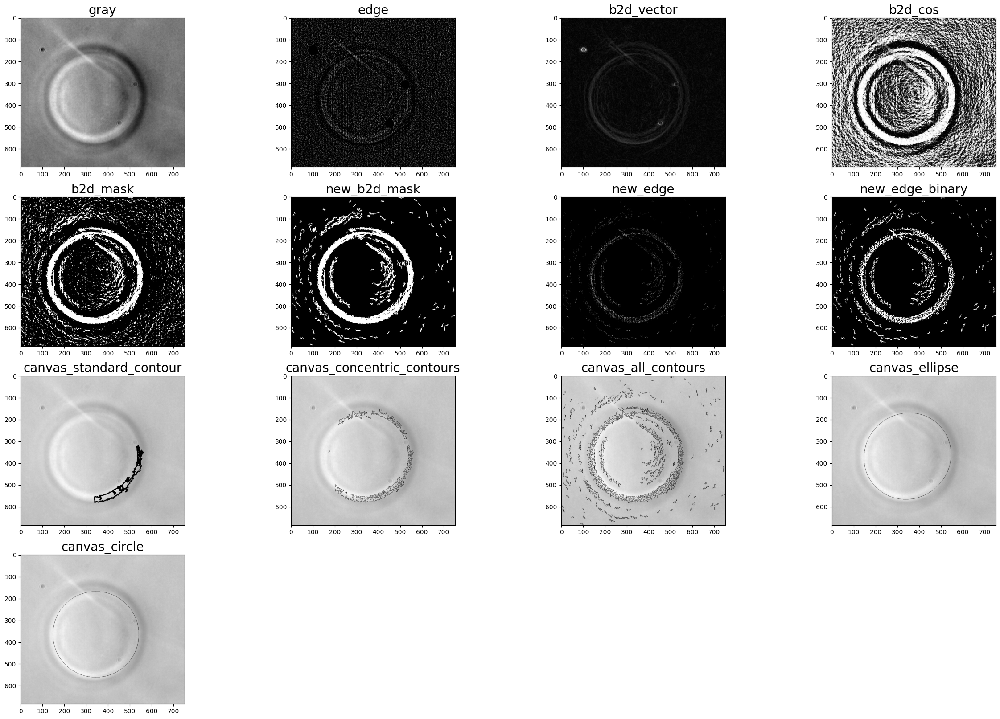

In [45]:
# index = 
index = 20
gray, edge, b2d_vector_image, cos_image, b2d_mask, new_b2d_mask, new_edge, new_edge_binary = test_run(instance, index)

In [ ]:
from modules.grouping import count_label_sizes
from modules.fitting import fit_points_to_circle_iteration, cross_circle_and_labels

def get_noise_suppressed_b2d_vector_image(b2d_vector_image, cos_image, dust_mask):
    dst = b2d_vector_image.copy()
    dst[dust_mask == 1] = 0
    dst[cos_image < 0.3] = 0
    dst = cv2.GaussianBlur(dst, (11, 11), sigmaX=0, sigmaY=0)
    thresh = np.mean(dst) + np.std(dst) * 2
    dst[dst < thresh] = 0
    return dst

def get_large_label_indices(nlabels, labels, debug_mode=False):
    label_sizes = count_label_sizes(nlabels, labels)
    if debug_mode:
        plt.plot(label_sizes) # debug
        plt.plot([np.mean(label_sizes) + np.std(label_sizes)] * len(label_sizes))
    thresh = min(1000, np.mean(label_sizes) + np.std(label_sizes))
    return np.where(label_sizes > thresh)[0]

@jit(nopython=True)
def _is_inside_circle(x, y, cx, cy, cr):
    return (x - cx)**2 + (y - cy)**2 <= cr**2

@jit(nopython=True)
def _cross_circle_and_labels(labels, label_indices, cx, cy, cr, w_in, w_out):
    res = {}
    for label_id in label_indices:
        res[label_id] = False
    for y in range(labels.shape[0]):
        for x in range(labels.shape[1]):
            label_id = labels[y, x]
            if label_id in label_indices and res[label_id] == False:
                if _is_inside_circle(x, y, cx, cy, cr + w_out) and not _is_inside_circle(x, y, cx, cy, cr - w_in):
                    res[label_id] = True
    return list(res.values())

#############################################################################

def test_run2(instance, index):
    gray = instance.gray_images[index]

    # mass center
    dilated_dust_mask = get_dilated_mask(instance.dust_mask)
    cx, cy = compute_mass_center(gray, dilated_dust_mask)

    # edge points
    edge = get_bright_edge(gray)
    edge[dilated_dust_mask == 1] = 0

    # b2d data
    blurred = cv2.GaussianBlur(gray, ksize=(7, 7), sigmaX=0, sigmaY=0)
    b2d_vector_image, cos_image = get_b2d_data(blurred, cx, cy, sobel_ksize=3)

    # ノイズ除去
    noise_suppressed = get_noise_suppressed_b2d_vector_image(b2d_vector_image, cos_image, instance.dust_mask)
    noise_suppressed[noise_suppressed > 0] = 1
    dilated = cv2.dilate(noise_suppressed.astype('uint8'), kernel=(5, 5))

    # 細かい領域は無視する
    nlabels, labels = cv2.connectedComponents(dilated.astype('uint8'))
    large_label_indices = get_large_label_indices(nlabels, labels)
    large_labels = np.zeros(labels.shape)
    for index in large_label_indices:
        large_labels[labels == index] = 1

    # 余分なlabelを排除する
    binary_image = np.zeros(large_labels.shape)
    binary_image[large_labels > 0] = 1
    arr_circle, arr_points = fit_points_to_circle_iteration(binary_image, itr=1)
    cv2.circle(large_labels, (int(arr_circle[0][0]), int(arr_circle[0][1])), int(arr_circle[0][2]), 2, 2)
    appropriate_label_indices = large_label_indices[_cross_circle_and_labels(labels, large_label_indices, arr_circle[0][0], arr_circle[0][1], arr_circle[0][2], w_in=5, w_out=50)]

    # 絞り込んだlabelたちを円近似
    binary_image = np.zeros(labels.shape)
    for label_id in appropriate_label_indices:
        binary_image[labels == label_id] = 1
    num_itr = 2
    arr_circle, arr_points = fit_points_to_circle_iteration(binary_image, w_out=10, itr=num_itr)

    # draw
    canvas = np.copy(gray)
    for i in range(num_itr):
        cx, cy, cr = map(int, arr_circle[i])
        cv2.circle(canvas, (cx, cy), cr, color=0, thickness=1+i)
    
    print('large label indices:', large_label_indices)
    display_images([gray, edge, b2d_vector_image, cos_image, labels, large_labels, binary_image, canvas], w=4)

def run2(instance):
    list_arr_circle = []
    list_arr_points = []
    for gray in instance.gray_images[:60]:
        # mass center
        dilated_dust_mask = get_dilated_mask(instance.dust_mask)
        cx, cy = compute_mass_center(gray, dilated_dust_mask)

        # edge points
        edge = get_bright_edge(gray)
        edge[dilated_dust_mask == 1] = 0

        # b2d data
        blurred = cv2.GaussianBlur(gray, ksize=(7, 7), sigmaX=0, sigmaY=0)
        b2d_vector_image, cos_image = get_b2d_data(blurred, cx, cy, sobel_ksize=3)

        # ノイズ除去
        noise_suppressed = get_noise_suppressed_b2d_vector_image(b2d_vector_image, cos_image, instance.dust_mask)
        noise_suppressed[noise_suppressed > 0] = 1
        dilated = cv2.dilate(noise_suppressed.astype('uint8'), kernel=(5, 5))

        # 細かい領域は無視する
        nlabels, labels = cv2.connectedComponents(dilated.astype('uint8'))
        large_label_indices = get_large_label_indices(nlabels, labels)
        large_labels = np.zeros(labels.shape)
        for index in large_label_indices:
            large_labels[labels == index] = 1

        # 余分なlabelを排除する
        binary_image = np.zeros(large_labels.shape)
        binary_image[large_labels > 0] = 1

        arr_circle, arr_points = fit_points_to_circle_iteration(binary_image, itr=1)
        appropriate_label_indices = large_label_indices[_cross_circle_and_labels(labels, large_label_indices, arr_circle[0][0], arr_circle[0][1], arr_circle[0][2], w_in=5, w_out=50)]

        # 絞り込んだlabelたちを円近似
        binary_image = np.zeros(labels.shape)
        for label_id in appropriate_label_indices:
            binary_image[labels == label_id] = 1
        
        num_itr = 2
        arr_circle, arr_points = fit_points_to_circle_iteration(binary_image, w_out=10, itr=num_itr)

        list_arr_circle.append(arr_circle)
        list_arr_points.append(arr_points)
    
    return list_arr_circle, list_arr_points

large label indices: [ 1  5 14 17 33 38]


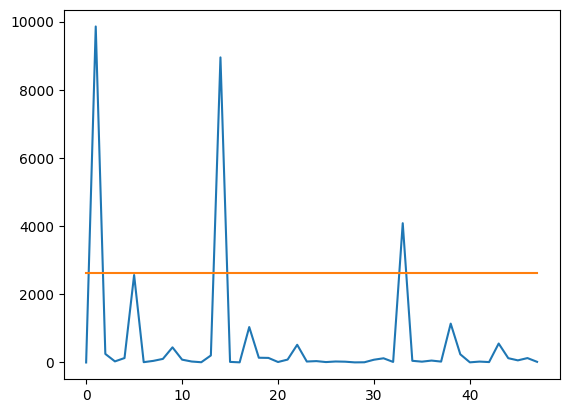

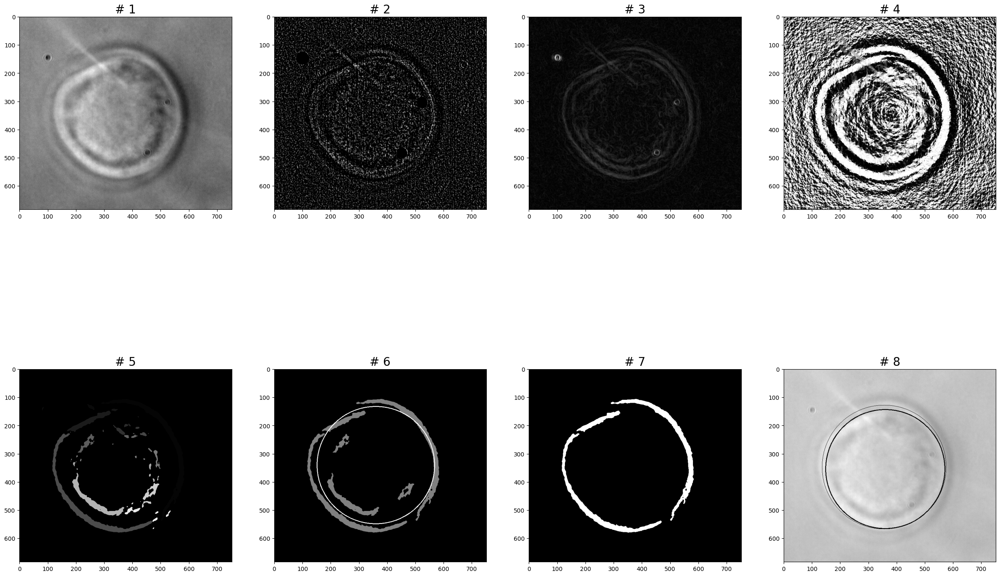

In [113]:
test_run2(instance, 35)

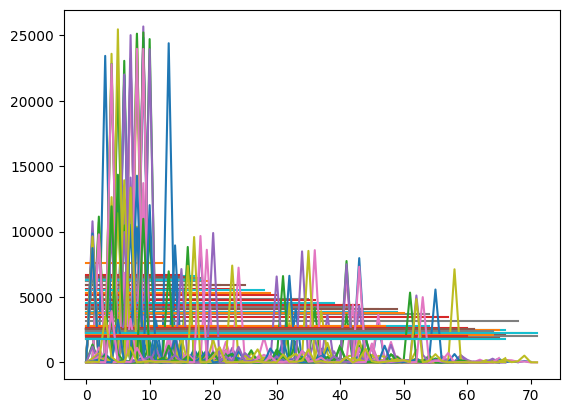

In [114]:
list_arr_circle, list_arr_points = run2(instance)

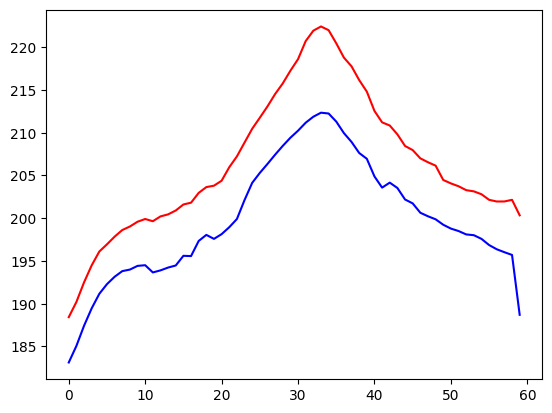

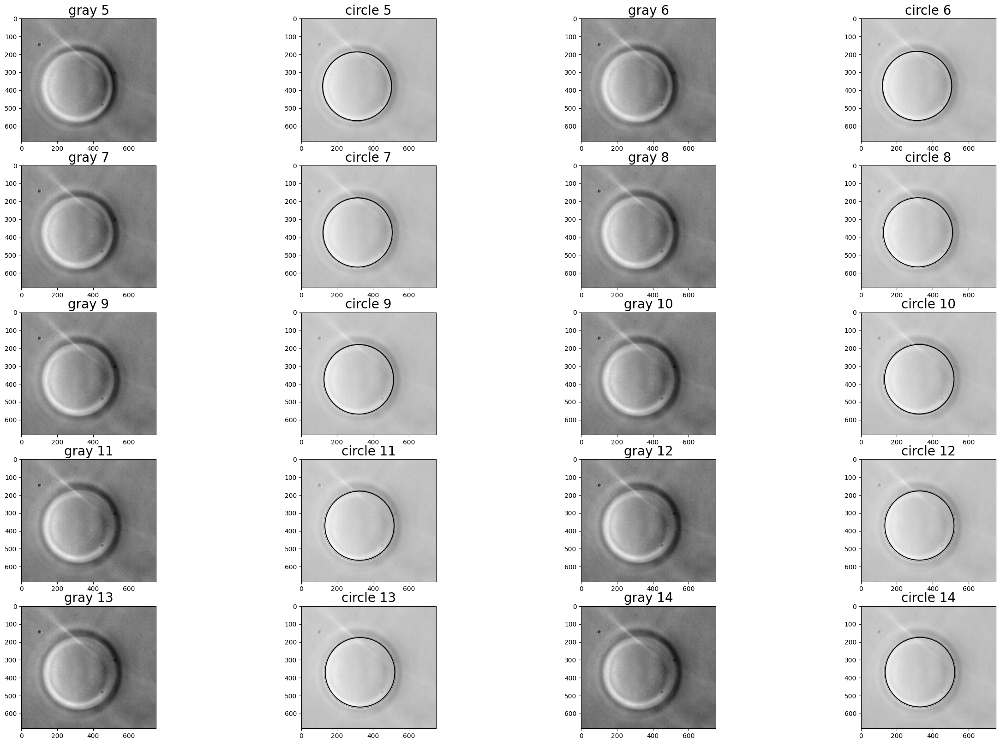

In [119]:
plt.plot([arr_circle[0][2] for arr_circle in list_arr_circle], color='red')
plt.plot([arr_circle[1][2] for arr_circle in list_arr_circle], color='blue')
# plt.plot([arr_circle[1][2] / arr_circle[0][2] for arr_circle in list_arr_circle])

canvases = []
names = []
for i in range(5, 15):
    canvas = instance.gray_images[i].copy()
    cx, cy, cr = map(int, list_arr_circle[i][0])
    cv2.circle(canvas, (cx, cy), cr, 0, 1)
    cx, cy, cr = map(int, list_arr_circle[i][1])
    cv2.circle(canvas, (cx, cy), cr, 0, 3)
    canvases.append(instance.gray_images[i])
    canvases.append(canvas)
    names.append(f'gray {i}')
    names.append(f'circle {i}')

display_images(canvases, names, w=4)

# エッジ検出の新しい方法
使えそう

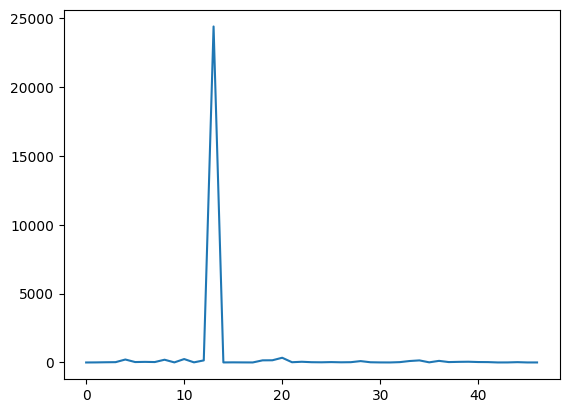

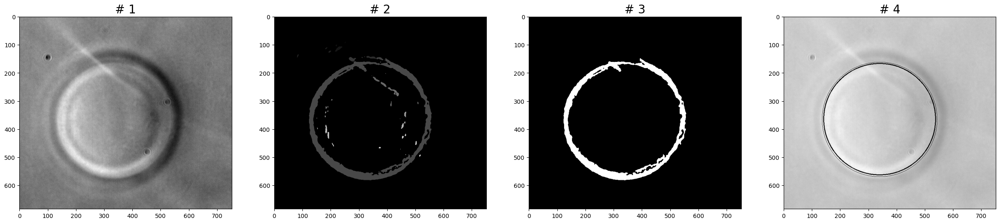

In [46]:
def get_noise_suppressed_b2d_vector_image(b2d_vector_image, cos_image, dust_mask):
    dst = b2d_vector_image.copy()
    dst[dust_mask == 1] = 0
    dst[cos_image < 0.3] = 0
    dst = cv2.GaussianBlur(dst, (11, 11), sigmaX=0, sigmaY=0)
    thresh = np.mean(dst) + np.std(dst) * 2
    dst[dst < thresh] = 0
    return dst

@jit(nopython=True)
def count_label_sizes(nlabels, labels):
    res = np.zeros(nlabels)
    for y in range(labels.shape[0]):
        for x in range(labels.shape[1]):
            label_id = labels[y, x]
            if label_id > 0:
                res[label_id] += 1
    return res

def get_large_label_indices(nlabels, labels):
    label_sizes = count_label_sizes(nlabels, labels)
    plt.plot(label_sizes)
    return np.where(label_sizes > np.mean(label_sizes) + np.std(label_sizes))[0]

@jit(nopython=True)
def _is_inside_circle(x, y, cx, cy, cr):
    return (x - cx)**2 + (y - cy)**2 <= cr**2

@jit(nopython=True)
def _get_points_inside_points_circle(binary_image, cx, cy, cr):
    points = []
    for y in range(binary_image.shape[0]):
        for x in range(binary_image.shape[1]):
            if binary_image[y, x] == 1 and _is_inside_circle(x, y, cx, cy, cr):
                points.append((x, y))
    return points

def fit_points_to_circle_iteration(binary_image, cx=0, cy=0, cr=1e6, itr=2):
    arr_points  = []
    arr_circle = []
    for i in range(itr):
        points = _get_points_inside_points_circle(binary_image, cx, cy, cr)
        cx, cy, cr = fit2circle_points(points)
        arr_points.append(points)
        arr_circle.append((cx, cy, cr))
    return arr_circle, arr_points

@jit(nopython=True)
def cross_circle_and_labels(labels, label_indices, cx, cy, cr, width=10):
    res = {}
    for label_id in label_indices:
        res[label_id] = False
    for y in range(labels.shape[0]):
        for x in range(labels.shape[1]):
            label_id = labels[y, x]
            if label_id in label_indices and res[label_id] == False:
                if _is_inside_circle(x, y, cx, cy, cr + width / 2) and not _is_inside_circle(x, y, cx, cy, cr - width / 2):
                    res[label_id] = True
    return list(res.values())

# ノイズ除去
noise_suppressed = get_noise_suppressed_b2d_vector_image(b2d_vector_image, cos_image, instance.dust_mask)
noise_suppressed[noise_suppressed > 0] = 1
dilated = cv2.dilate(noise_suppressed.astype('uint8'), kernel=(5, 5))

# 細かい領域は無視する
nlabels, labels = cv2.connectedComponents(dilated.astype('uint8'))
large_label_indices = get_large_label_indices(nlabels, labels)
large_labels = np.zeros(labels.shape)
for index in large_label_indices:
    large_labels[labels == index] = 1

# 余分なlabelを排除する
binary_image = np.zeros(large_labels.shape)
binary_image[large_labels > 0] = 1
arr_circle, arr_points = fit_points_to_circle_iteration(binary_image, itr=1)
appropriate_label_indices = large_label_indices[cross_circle_and_labels(labels, large_label_indices, arr_circle[0][0], arr_circle[0][1], arr_circle[0][2], width=10)]

# 絞り込んだlabelたちを円近似
binary_image = np.zeros(labels.shape)
for label_id in appropriate_label_indices:
    binary_image[labels == label_id] = 1
num_itr = 2
arr_circle, arr_points = fit_points_to_circle_iteration(binary_image, itr=num_itr)

# draw
canvas = np.copy(gray)
for i in range(num_itr):
    cx, cy, cr = map(int, arr_circle[i])
    cv2.circle(canvas, (cx, cy), cr, color=0, thickness=1+i)
display_images([gray, labels, binary_image, canvas])



In [79]:
# 曲率が大きい部分を除外して、concentric contoursを探索する
""" 1. 基準となる輪郭の選定 """
# 明るさの微分（b2d_vector size）が十分大きい画素を最も多く含む連続領域を計算
def _compute_largest_brightness_diff_label_id(b2d_vector_image, dust_mask, nlabels, labels):
    large_diff_mask = b2d_vector_image.copy()
    large_diff_mask = delete_drawings(large_diff_mask)
    large_diff_mask[get_dilated_mask(dust_mask) == 1] = 0
    large_diff_mask[100:150, 140:200] = 0
    # large_diff_mask = to_mask(large_diff_mask, np.mean(b2d_vector_image) + np.std(b2d_vector_image))
    large_diff_mask[large_diff_mask < np.mean(b2d_vector_image) + np.std(b2d_vector_image)] = 0
    large_diff_mask[large_diff_mask > 0] = 1
    large_diff_mask = large_diff_mask.astype('uint8')

    count_masked_labels = np.zeros(nlabels)
    for y in range(labels.shape[0]):
        for x in range(labels.shape[1]):
            if large_diff_mask[y, x] == 0:
                continue
            label_id = labels[y, x]
            if label_id == 0:
                continue
            count_masked_labels[label_id] += 1
    plt.plot(count_masked_labels)
    return np.argmax(count_masked_labels)

# 明るさの微分が十分大きい画素を最も多く含む連続領域　に対応する輪郭番号を返す
def get_largest_brightness_diff_contour_id(contours, edge_binary, b2d_vector_image, dust_mask):
    nlabels, labels = cv2.connectedComponents(edge_binary.astype('uint8'))
    largest_brightness_diff_label_id = _compute_largest_brightness_diff_label_id(b2d_vector_image, dust_mask, nlabels, labels)
    label_mask = to_mask(labels, largest_brightness_diff_label_id)

    counts = np.zeros(len(contours))
    for i, contour in enumerate(contours):
        for element in contour:
            x, y = element[0]
            if label_mask[y, x] == 1:
                counts[i] += 1
    return np.argmax(counts)


contours, _ = cv2.findContours(new_edge_binary.astype('uint8'), cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)
standard_contour_id = get_largest_brightness_diff_contour_id(contours, new_edge_binary, b2d_vector_image, p.dust_mask)
# concentric_contour_indices = select_concentric_contour_indices(contours, standard_contour_id, circle_thickness=10)
# concentric_contours = [c for i, c in enumerate(contours) if i in concentric_contour_indices]

NameError: name 'p' is not defined

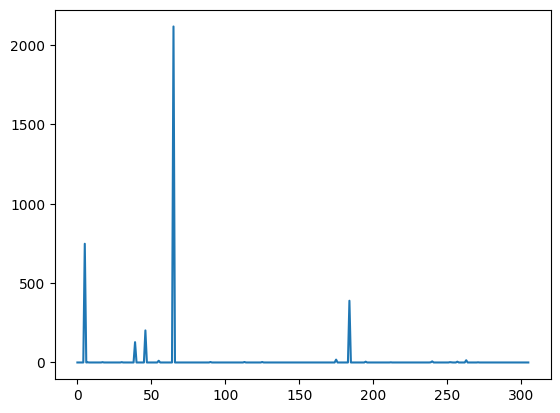

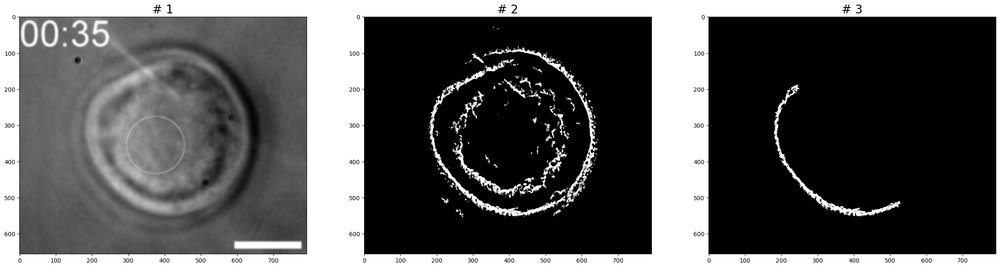

In [ ]:
nlabels, labels = cv2.connectedComponents(new_edge_binary.astype('uint8'))
largest_brightness_diff_label_id = _compute_largest_brightness_diff_label_id(b2d_vector_image, p.dust_mask, nlabels, labels)
label_mask = to_mask(labels, largest_brightness_diff_label_id)
display_images([gray, new_edge_binary, label_mask])
# largest_brightness_diff_label_id

# 突出部を除外して円、楕円検出

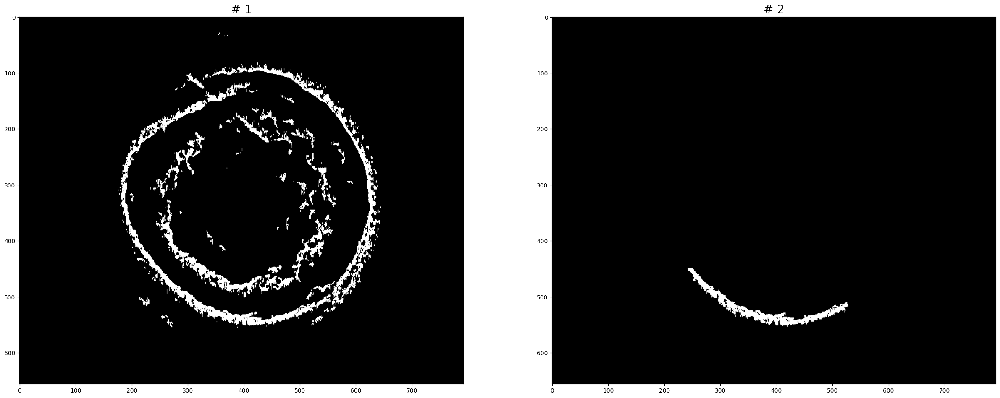

In [ ]:
tmp = label_mask.copy()
tmp[160:450, 180:290] = 0
display_images([new_edge_binary, tmp])

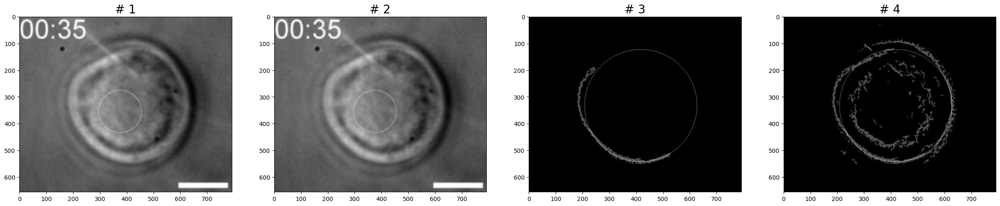

417 333 210


In [ ]:
def inside_area(point, x1, x2, y1, y2):
    x, y = point
    return x1 <= x and x < x2 and y1 <= y and y < y2

excluded_contour = [[[e[0][0], e[0][1]]] for e in contours[standard_contour_id] if not inside_area(e[0], 180, 290, 160, 400)]
x, y, r = map(int, fit2circle([excluded_contour]))
circ = np.zeros(gray.shape)
cv2.circle(circ, (x, y), r, 2, 1)
display_images([gray, gray + circ, label_mask + circ, new_edge_binary+circ])
print(x, y, r)

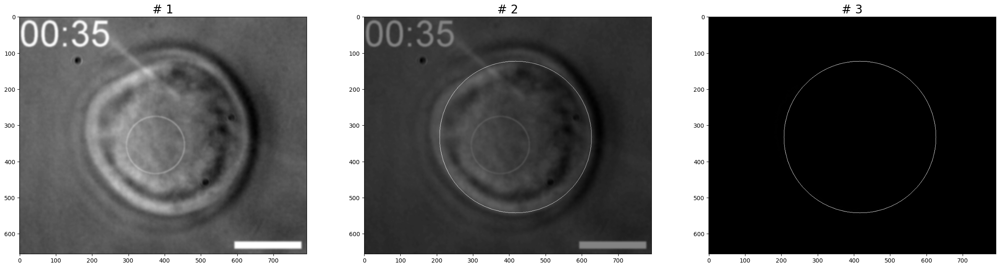

417 333 210


In [ ]:
def inside_area(point, x1, x2, y1, y2):
    x, y = point
    return x1 <= x and x < x2 and y1 <= y and y < y2

excluded_contour = [[[e[0][0], e[0][1]]] for e in contours[standard_contour_id] if not inside_area(e[0], 180, 290, 160, 400)]
x, y, r = map(int, fit2circle([excluded_contour]))
circ = np.zeros(gray.shape)
cv2.circle(circ, (x, y), r, 200, 1)
display_images([gray, gray + circ, label_mask + circ, new_edge_binary+])
print(x, y, r)

# 突出部を検出する

### まずは細線化

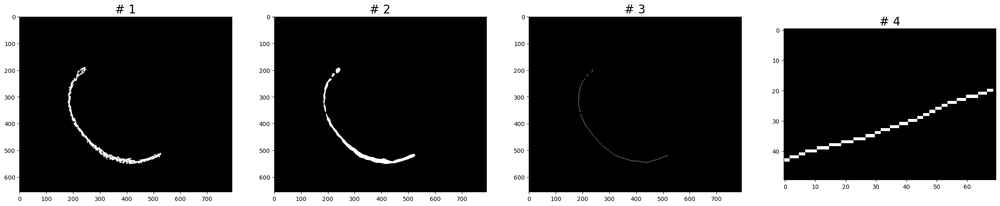

In [ ]:
import skimage
tmp = cv2.dilate(label_mask, kernel=(7, 7))
tmp = cv2.GaussianBlur(tmp, ksize=(31, 31), sigmaX=0, sigmaY=0)
tmp[tmp > 0] = 1
thinned = skimage.morphology.thin(tmp)
display_images([label_mask, tmp, thinned, thinned[500:550, 450:520]])

### 点群を一次元配列に落とし込む

In [ ]:
def get_neighbour_points(binary_image, x, y):
    dp1 = [(1, 0), (-1, 0), (0, 1), (0, -1)]
    dp2 = [(1, 1), (1, -1), (-1, 1), (-1, -1)]
    k = np.ones((3, 3))
    k[1, 1] = 0
    res = []
    for d in dp1:
        dx, dy = d
        nx, ny = x + dx, y + dy
        if binary_image[ny, nx] == 1:
            k[1 + dy, 1 + dx] = 0
            res.append((nx, ny))
    if len(res) < 2:
        for d in dp2:
            dx, dy = d
            nx, ny = x + dx, y + dy
            if binary_image[ny, nx] == 1 and k[1 + dy, 1 + dx] == 1:
                res.append((nx, ny))
    return res

def box_area_sum(binary_image, x, y, k):
    r = k // 2
    x1, y1 = max(0, x - r), max(0, y - r)
    x2, y2 = min(binary_image.shape[1], x + r + 1), min(binary_image.shape[0], y + r + 1)
    return np.sum(binary_image[y1:y2, x1:x2])

def get_end_points(binary_image):
    res = []
    for y in range(binary_image.shape[0]):
        for x in range(binary_image.shape[1]):
            cnt = 0
            if binary_image[y, x] == 1:
                ds = [(1, 0), (-1, 0), (0, 1), (0, -1), (1, 1), (1, -1), (-1, 1), (-1, -1)]
                for d in ds:
                    dx, dy = d
                    nx, ny = x + dx, y + dy
                    if binary_image[ny, nx] == 1:
                        cnt += 1
            if cnt == 1 and (box_area_sum(binary_image, x, y, 5) > box_area_sum(binary_image, x, y, 3)):
                res.append((x, y))
    return res

def get_points_and_neighbours(binary_image):
    points_data = {}
    for y in range(binary_image.shape[0]):
        for x in range(binary_image.shape[1]):
            if binary_image[y, x] == 1:
                neighbour_points = get_neighbour_points(binary_image, x, y)
                if len(neighbour_points) > 2:
                    print('Too many branch was found:', (x, y))
                    return None
                points_data[(x, y)] = neighbour_points
    return points_data

def to_a_point_array(binary_image):
    end_points = get_end_points(binary_image)
    if len(end_points) != 2:
        print('There must be 2 end points.', end_points)
        return None
    points_data = get_points_and_neighbours(binary_image)
    if points_data is None:
        return None
    
    now = end_points[0]
    arr = []
    while(now != end_points[1]):
        arr.append(now)
        done = True
        for neighbour_point in points_data[now]:
            if neighbour_point not in arr:
                done = False
                now = neighbour_point
                break
        if done:
            break
    return arr


In [ ]:
arr = to_a_point_array(thinned)
len(arr)

There must be 2 end points. [(239, 199), (233, 209), (221, 216), (215, 225), (211, 232), (191, 357), (194, 365), (518, 520)]


TypeError: object of type 'NoneType' has no len()

In [ ]:
computation_size = 200
canvas = gray.copy().astype('uint8') * 2
hs = np.zeros(len(arr))
for i in range(len(arr)):
    cx, cy, r = fit2circle_points(arr[max(0, i - computation_size // 2) : min(len(arr), i + computation_size // 2)])
    hs[i] = r
    if (80 < i and i < 100) or (390 < i and i < 400) or (440 < i and i < 460):
        cv2.circle(canvas, (int(cx), int(cy)), int(r), color=1, thickness=1)

plt.imshow(canvas, cmap='gray')
plt.colorbar()

TypeError: object of type 'NoneType' has no len()

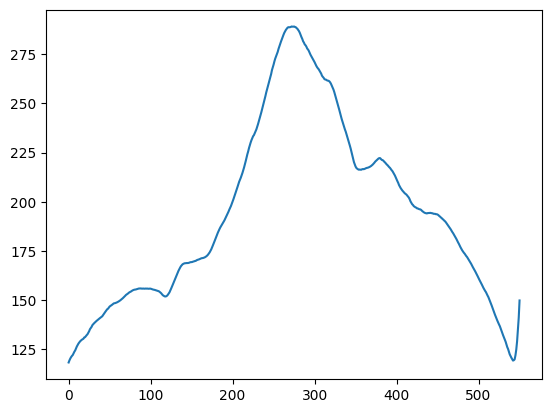

In [ ]:
plt.plot(hs)

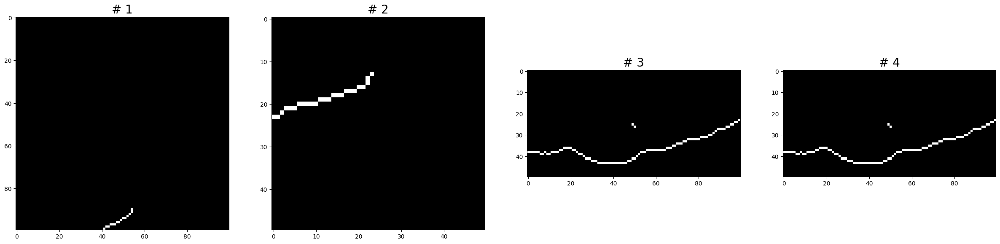

In [ ]:
display_images([thinned[100:200, 200:300], thinned[500:550, 500:550], thinned[500:550, 400:500], thinned[500:550, 400:500]])

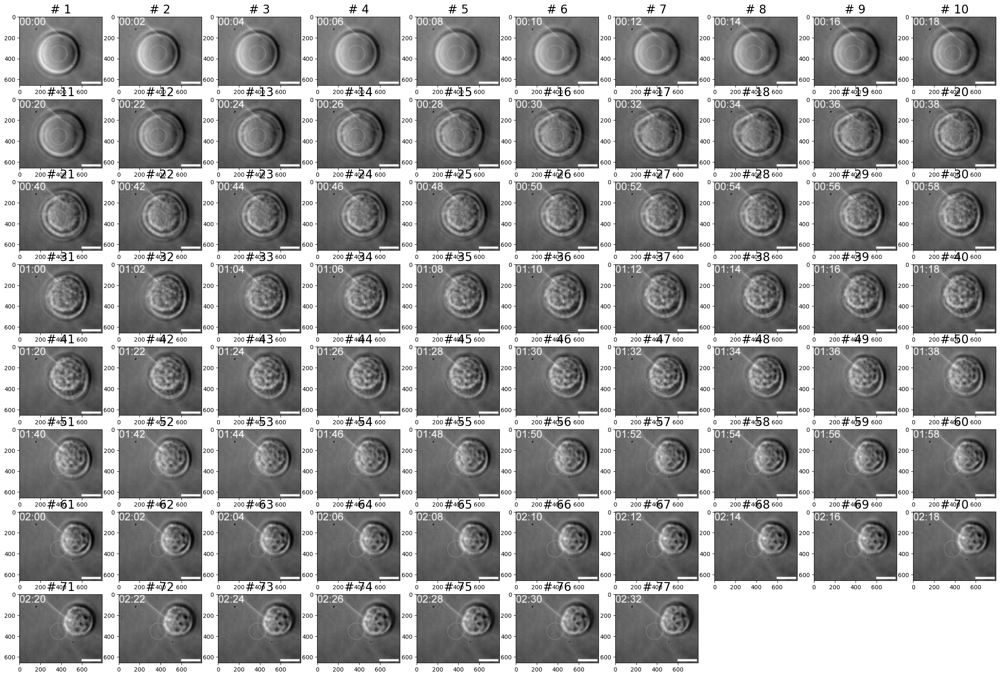

In [ ]:
display_images(p.gray_images[::2], w=10)